In [47]:
# Roberto Analysis

In [1]:
census_vars2 = [
 'pov_below150',
 'unemployed',
 'no_high_school',
 'minority_pop',
 'limited_eng',
 'crowded_units',
 'renter_occupied',
 'count_norm',
'single_parent',
]

In [2]:
corr = gdf_ct[census_vars].corr()
plt.figure(figsize=(10,9))
sns.heatmap(corr,annot=True,cmap='OrRd',fmt='.2f')
plt.show()

NameError: name 'gdf_ct' is not defined

In [50]:
gdf_ct['evictions_per_1000pop'] = gdf_ct['evictions_count']/gdf_ct['total_pop']*1000

In [51]:
gdf_ct.head()

,FIPS,total_pop,housing_units,households,pov_below150,unemployed,no_high_school,persons_over65,persons_under17,disabled_pop,...,crowded_units,no_vehicle,persons_group_quarters,geometry,evictions_count,renter_occupied,count_norm,w_count,evic_risk,evictions_per_1000pop
0,06037137000,5184,1842,1783,-1.158158,0.349381,-1.073658,25.8,19.3,16.2,...,-1.142478,1.4,0.7,"POLYGON ((-13209016.934 4051842.700, -13209002...",5,-1.024045,-0.443889,0.936654,False,0.964506
1,06037541605,5069,1456,1404,0.690360,0.397566,1.390621,10.0,20.0,11.7,...,0.437253,4.5,0.7,"POLYGON ((-13159778.097 4015837.431, -13159675...",2,-0.076162,-0.527664,-0.470995,False,0.394555
2,06037503301,3560,1056,1011,-1.145453,-0.638406,-1.026039,14.3,22.8,8.1,...,-1.058450,4.5,0.0,"POLYGON ((-13138507.725 4021922.075, -13138448...",1,-1.466678,-0.494504,-0.378704,False,0.280899
3,06037542601,3539,810,757,1.020679,-0.277020,1.301336,5.8,31.1,7.7,...,1.974971,7.3,0.1,"POLYGON ((-13161585.369 4016310.225, -13161523...",11,-0.587889,-0.405148,-0.478398,False,3.108223
4,06037609900,2015,670,644,-0.110029,-0.349297,-0.097470,25.2,18.7,15.0,...,-0.646712,7.1,12.8,"POLYGON ((-13170113.444 3993675.714, -13170113...",1,-1.058591,-0.524113,-0.317861,False,0.496278


In [52]:
import contextily as ctx


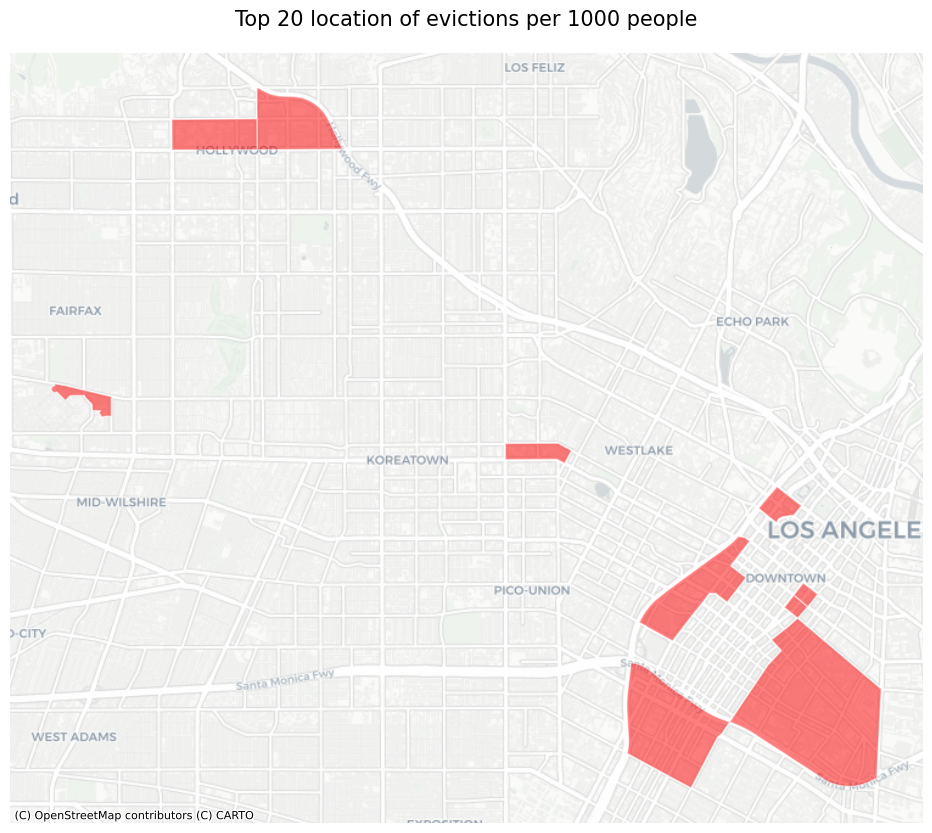

In [53]:
# map the top 20 geographies
fig,ax = plt.subplots(figsize=(12,10))
gdf_ct.sort_values(by='evictions_per_1000pop',ascending=False)[:10].plot(ax=ax,
                                                                 color='red',
                                                                 edgecolor='white',
                                                                 alpha=0.5)


# title
ax.set_title('Top 20 location of evictions per 1000 people',fontsize=15,pad=20)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

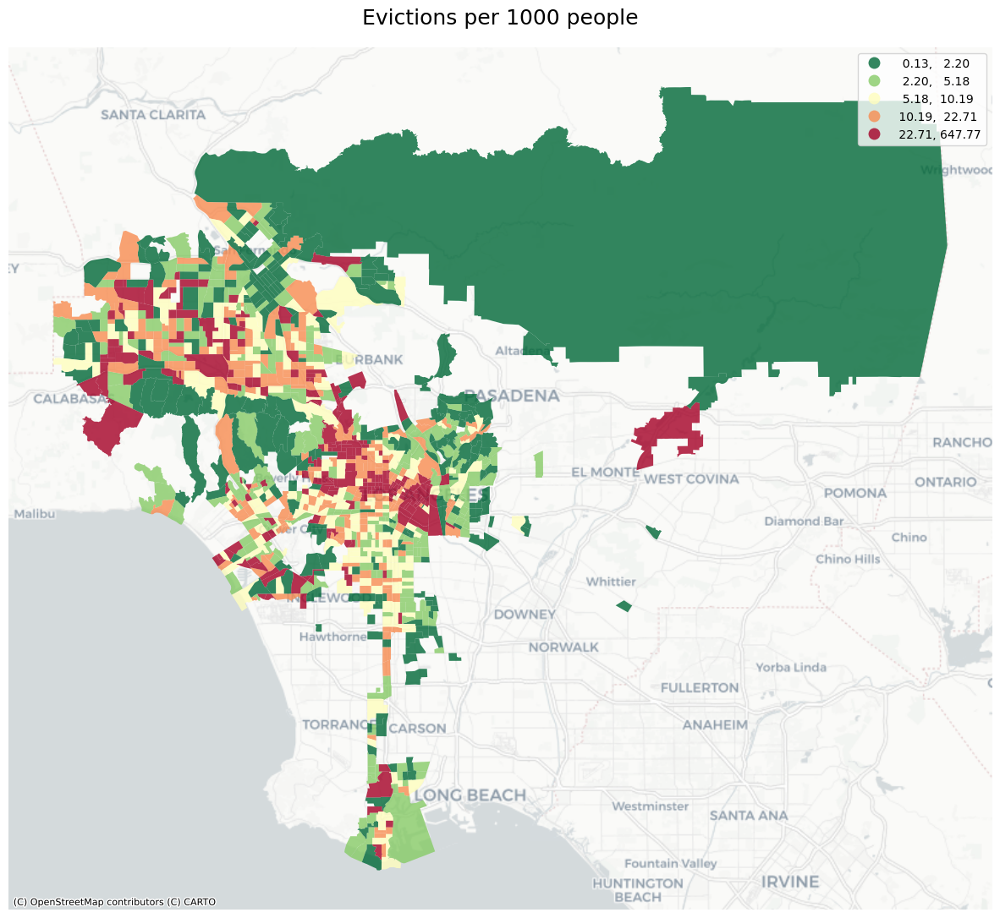

In [54]:
fig,ax = plt.subplots(figsize=(15,15))

gdf_ct.plot(ax=ax,
        column='evictions_per_1000pop', # this defines the field to "choropleth"
        legend=True,
        alpha=0.8,
        cmap='RdYlGn_r', # the "_r" reverses the color
        scheme='quantiles')

ax.axis('off')
ax.set_title('Evictions per 1000 people',fontsize=18,pad=20)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [55]:
# a quick interactive version: geopandas .explore function does it all, no need to import folium!
gdf_ct.explore(column='evictions_per_1000pop', # this defines the field to "choropleth"
        legend=True,
        cmap='RdYlGn_r', # the "_r" reverses the color
        scheme='quantiles',
        tiles='CartoDB positron',
        style_kwds={
            'weight':0.5,
            'color':'black',
            'opacity':0.5
        })

In [56]:
# a quick interactive version: geopandas .explore function does it all, no need to import folium!
gdf_ct.explore(column='evictions_per_1000pop', # this defines the field to "choropleth"
        legend=True,
        cmap='RdYlGn_r', # the "_r" reverses the color
        scheme='equalinterval',
        tiles='CartoDB positron',
        style_kwds={
            'weight':0.5,
            'color':'black',
            'opacity':0.5
        })

In [57]:
# a quick interactive version: geopandas .explore function does it all, no need to import folium!
gdf_ct.explore(column='evictions_per_1000pop', # this defines the field to "choropleth"
        legend=True,
        cmap='RdYlGn_r', # the "_r" reverses the color
        scheme='naturalbreaks',
        tiles='CartoDB positron',
        style_kwds={
            'weight':0.5,
            'color':'black',
            'opacity':0.5
        })

In [58]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(gdf_ct,k=8)

# Row-standardization
wq.transform = 'r'

In [59]:
gdf_ct['evictions_per_1000poplag'] = lps.weights.lag_spatial(wq, gdf_ct['evictions_per_1000pop'])

In [60]:
gdf_ct.sample(10)[['FIPS','total_pop','evictions_count','evictions_per_1000pop','evictions_per_1000poplag']]

,FIPS,total_pop,evictions_count,evictions_per_1000pop,evictions_per_1000poplag
596,06037113323,4029,104,25.812857,21.609098
1046,06037115403,3597,115,31.971087,18.002314
234,06037134101,5455,60,10.999083,10.844151
925,06037123204,3508,42,11.972634,14.985092
985,06037185203,2862,1,0.349406,3.797821
498,06037980010,119,2,16.806723,12.939142
761,06037214100,3532,21,5.945640,88.417136
800,06037232800,4568,37,8.099825,6.456751
972,06037264103,2751,21,7.633588,20.708500
947,06037108104,1818,2,1.100110,3.257872


In [100]:
gdf_ct['evictions_lag_diff'] = gdf_ct['evictions_per_1000pop'] - gdf_ct['evictions_per_1000poplag']

In [103]:
gdf_ct.sort_values(by='evictions_lag_diff')

,FIPS,total_pop,housing_units,households,pov_below150,unemployed,no_high_school,persons_over65,persons_under17,disabled_pop,...,persons_group_quarters,geometry,evictions_count,renter_occupied,count_norm,w_count,evic_risk,evictions_per_1000pop,evictions_per_1000poplag,evictions_lag_diff
626,06037206301,1867,1382,1138,3.307505,5.071485,-0.246279,24.0,0.8,60.8,...,35.9,"POLYGON ((-13163575.650 4034612.267, -13163418...",20,0.642847,-0.420993,1.735463,False,10.712373,226.908971,-216.196598
579,06037206303,1989,760,564,4.304815,8.613063,1.093003,10.9,1.1,48.8,...,68.0,"POLYGON ((-13163169.668 4034268.889, -13163027...",16,-0.542546,-0.348985,1.755582,False,8.044243,207.090108,-199.045865
634,06037206302,2400,753,640,3.904621,7.745738,0.253720,8.1,1.0,44.1,...,73.3,"POLYGON ((-13163199.390 4034398.394, -13163144...",1,-0.378448,-0.534599,1.415705,False,0.416667,192.524422,-192.107755
638,06037207305,961,758,640,-1.405897,-0.036097,-0.270089,0.0,9.6,2.2,...,0.0,"POLYGON ((-13164024.935 4034968.150, -13163875...",96,-0.434587,0.537204,1.786341,True,99.895942,231.352297,-131.456355
635,06037206201,2154,1403,1240,0.925395,1.963570,-0.674849,10.8,3.2,24.2,...,15.5,"POLYGON ((-13163191.709 4035071.465, -13163104...",145,0.804786,0.299716,1.422189,True,67.316620,195.643390,-128.326770
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
855,06037191000,4817,4132,2811,0.023369,0.542120,-0.764135,4.1,11.0,6.9,...,1.5,"POLYGON ((-13172068.659 4042938.595, -13172063...",1554,4.086748,3.428110,0.515344,True,322.607432,69.265198,253.342234
983,06037207501,2133,1671,1314,-0.383178,-0.060189,-1.305800,7.3,6.0,4.8,...,0.0,"POLYGON ((-13164159.409 4036374.326, -13164128...",844,0.677394,4.630918,1.171119,True,395.686826,124.702623,270.984203
30,06037224020,2746,1020,895,1.694022,0.108457,1.194193,2.1,28.9,9.4,...,0.7,"POLYGON ((-13166257.559 4033229.280, -13166256...",1056,0.081459,8.026713,-0.045351,True,384.559359,29.986535,354.572824
701,06037211123,1478,983,784,0.061483,0.156642,-0.776040,13.3,2.4,5.7,...,0.0,"POLYGON ((-13168165.575 4037356.306, -13167972...",654,-0.067525,5.230694,0.579979,True,442.489851,68.571162,373.918689


## FIPS with highest negative difference in evictions

In [106]:
gdf_donut = gdf_ct.sort_values(by='evictions_lag_diff').head(1)
gdf_donut

,FIPS,total_pop,housing_units,households,pov_below150,unemployed,no_high_school,persons_over65,persons_under17,disabled_pop,...,persons_group_quarters,geometry,evictions_count,renter_occupied,count_norm,w_count,evic_risk,evictions_per_1000pop,evictions_per_1000poplag,evictions_lag_diff
626,06037206301,1867,1382,1138,3.307505,5.071485,-0.246279,24.0,0.8,60.8,...,35.9,"POLYGON ((-13163575.650 4034612.267, -13163418...",20,0.642847,-0.420993,1.735463,False,10.712373,226.908971,-216.196598


## FIPS with highest positive difference in evictions

In [108]:
gdf_diamond = gdf_ct.sort_values(by='evictions_lag_diff').tail(1)
gdf_diamond

,FIPS,total_pop,housing_units,households,pov_below150,unemployed,no_high_school,persons_over65,persons_under17,disabled_pop,...,persons_group_quarters,geometry,evictions_count,renter_occupied,count_norm,w_count,evic_risk,evictions_per_1000pop,evictions_per_1000poplag,evictions_lag_diff
632,06037207308,1323,949,830,-0.8596,0.373474,-1.258181,3.3,2.3,3.0,...,0.0,"POLYGON ((-13163753.761 4034822.786, -13163724...",857,0.031797,6.604098,1.014505,True,647.770219,163.436968,484.333251


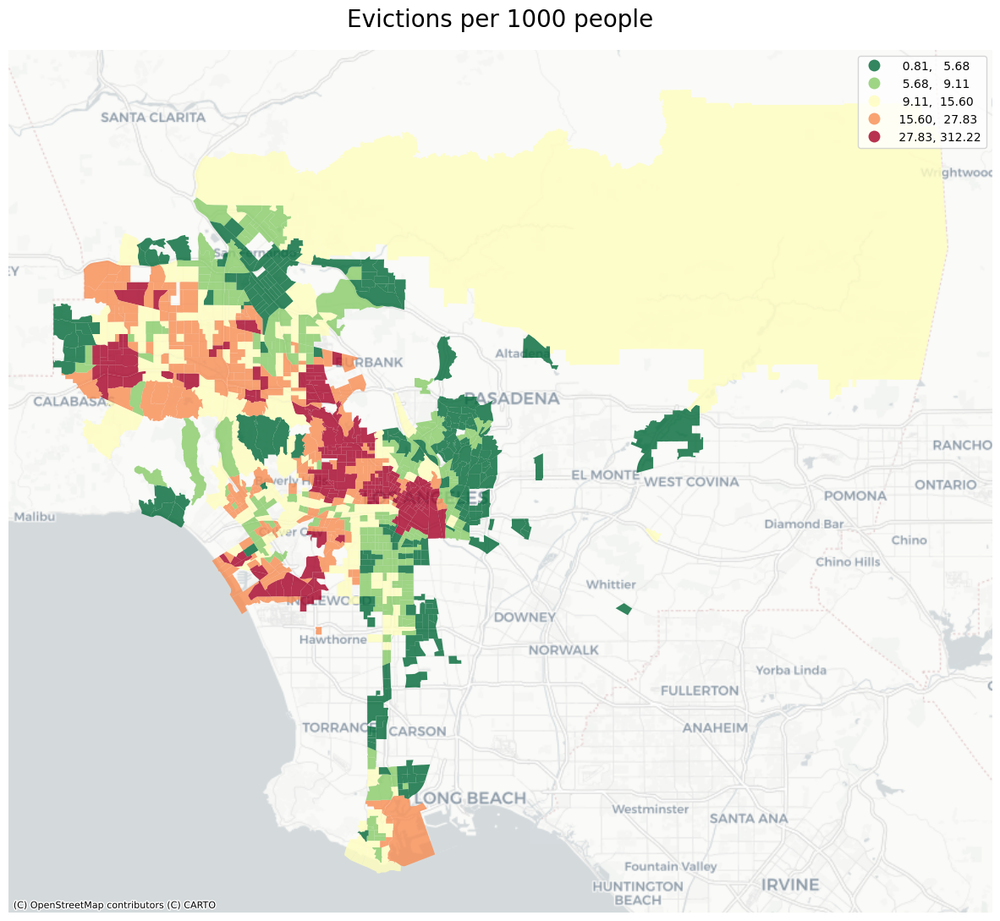

In [111]:
# use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
gdf_ct.plot(ax=ax,
         figsize=(15,15),
         column='evictions_per_1000poplag',
         legend=True,
         alpha=0.8,
         cmap='RdYlGn_r',
         scheme='quantiles')

ax.axis('off')
ax.set_title('Evictions per 1000 people',fontsize=20,pad=20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

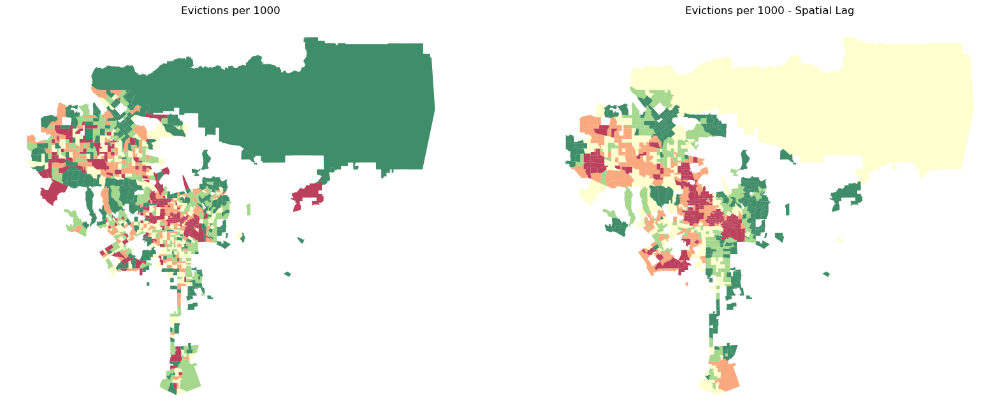

In [114]:
# create the 1x2 subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 12))

# two subplots produces ax[0] (left) and ax[1] (right)

# regular count map on the left
gdf_ct.plot(ax=ax[0], # this assigns the map to the left subplot
         column='evictions_per_1000pop', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75, 
           )


ax[0].axis("off")
ax[0].set_title("Evictions per 1000")

# spatial lag map on the right
gdf_ct.plot(ax=ax[1], # this assigns the map to the right subplot
         column='evictions_per_1000poplag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75
           )

ax[1].axis("off")
ax[1].set_title("Evictions per 1000 - Spatial Lag")

plt.show()

In [115]:
y = gdf_ct.evictions_per_1000pop
moran = Moran(y, wq)
moran.I

0.40792221805821205

In [116]:
y = gdf_ct.evictions_per_1000poplag
moran = Moran(y, wq)
moran.I

0.8622960602800591

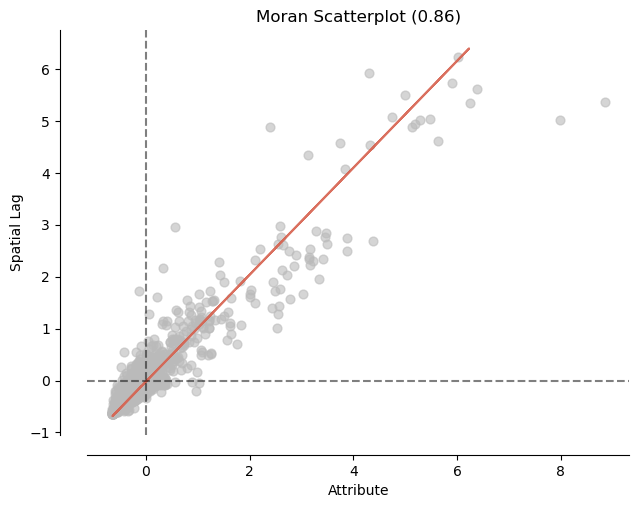

In [117]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

In [ ]:
##

/opt/conda/lib/python3.11/site-packages/splot/_viz_esda_mpl.py:354: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Reference Distribution'}, xlabel='Moran I: 0.86', ylabel='Density'>)

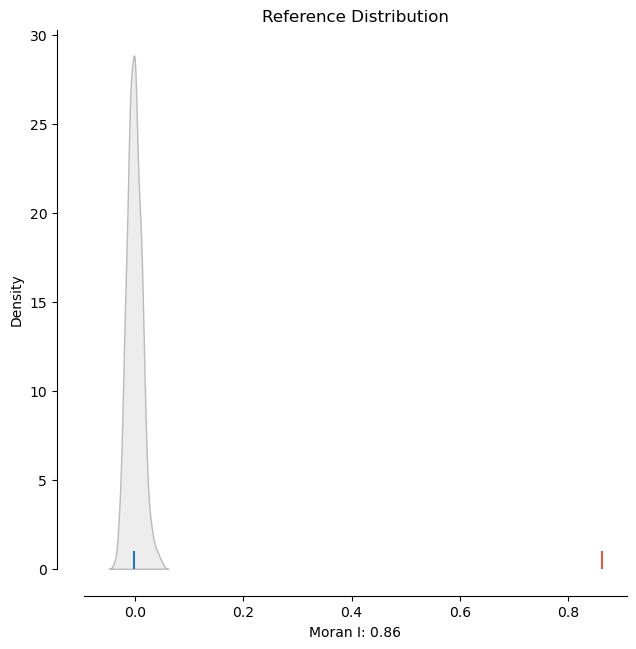

In [118]:
plot_moran_simulation(moran,aspect_equal=False)

In [119]:
moran.p_sim

0.001

In [120]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

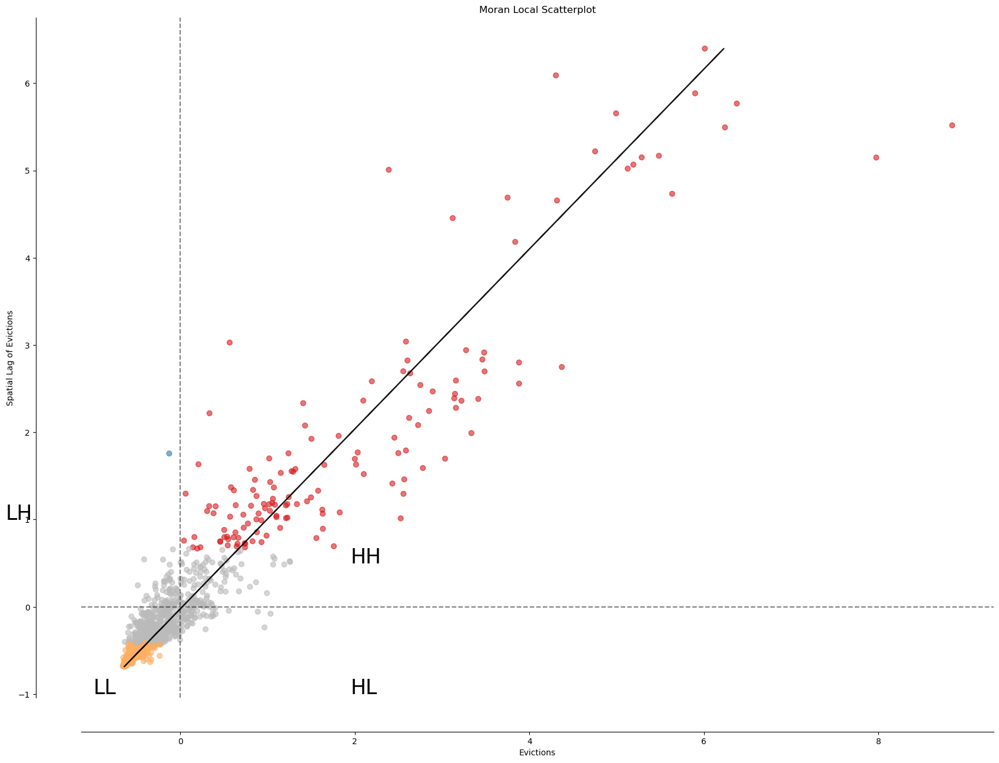

In [122]:
# Plot
fig,ax = plt.subplots(figsize=(20,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Evictions")
ax.set_ylabel('Spatial Lag of Evictions')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

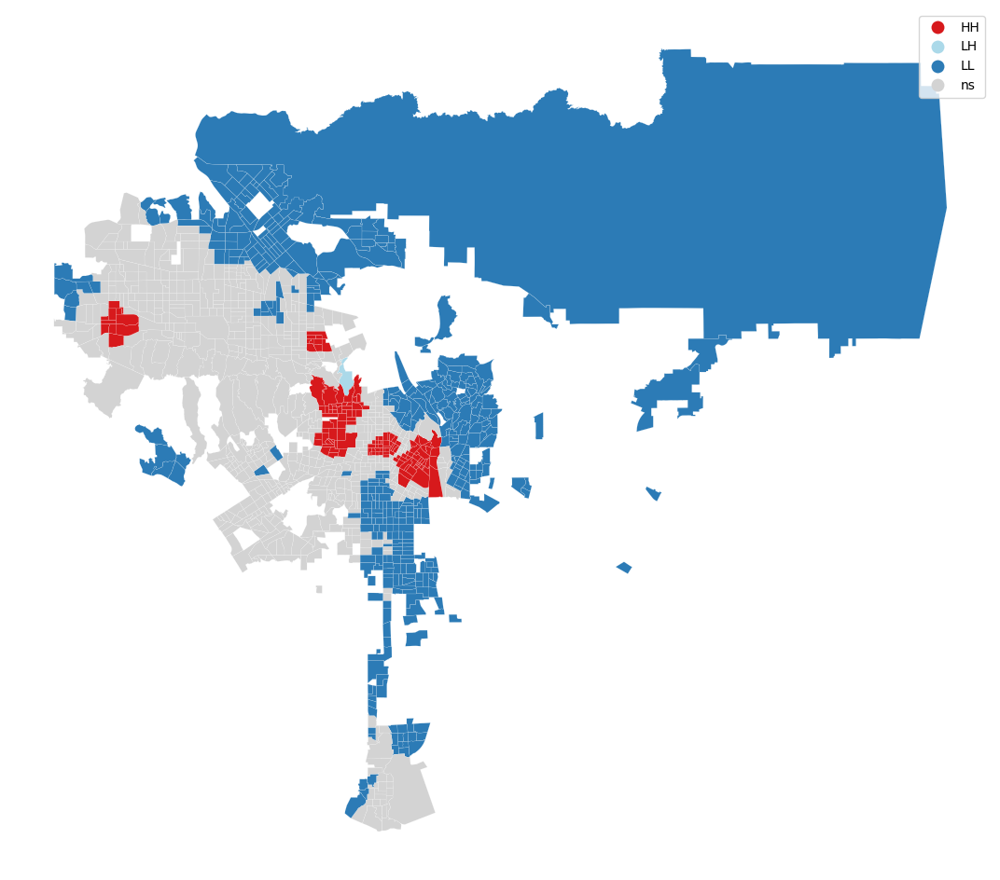

In [124]:
fig, ax = plt.subplots(figsize=(14,12))
lisa_cluster(lisa, gdf_ct, p=0.05, ax=ax)
plt.show()

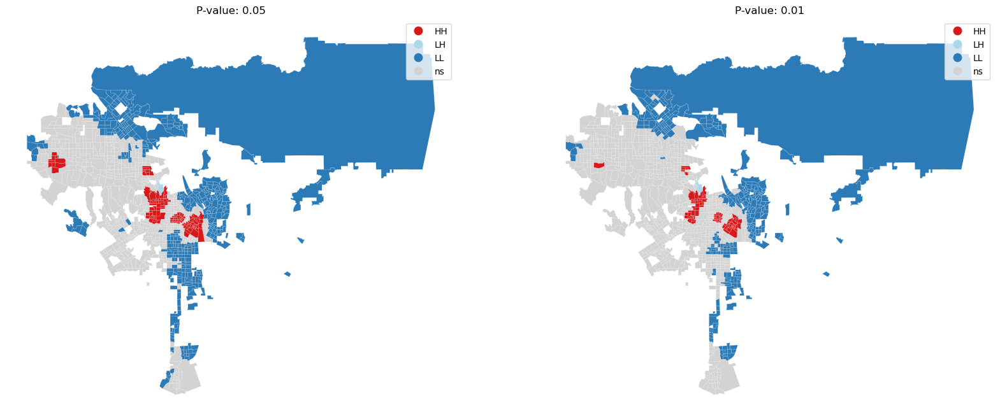

In [125]:
# create the 1x2 subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 12))

# regular count map on the left
lisa_cluster(lisa, gdf_ct, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

# spatial lag map on the right
lisa_cluster(lisa, gdf_ct, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

plt.show()